<a href="https://colab.research.google.com/github/zhengchunqiu/Colorize/blob/master/Video_Colorize.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DeOldify - Colorize your own videos!

DeOldify GIthub：https://github.com/jantic/DeOldify/blob/master/README.md

base code borrowed from this Google Colab Notebook.https://colab.research.google.com/github/jantic/DeOldify/blob/master/VideoColorizerColab.ipynb

* FYI: This notebook is intended as a tool to colorize gifs and short videos, if you are trying to convert longer video you may hit the limit on processing space. Running the Jupyter notebook on your own machine is recommended (and faster) for larger video sizes.

In [1]:
from os import path
import torch

print(torch.__version__)

1.1.0


# Git clone and install DeOldify

In [2]:
!git clone https://github.com/jantic/DeOldify.git DeOldify

fatal: destination path 'DeOldify' already exists and is not an empty directory.


In [3]:
cd DeOldify/

/content/DeOldify


# Setup

In [4]:
!pip install -r requirements.txt

In [0]:
import fastai
from fasterai.visualize import *
from pathlib import Path

torch.backends.cudnn.benchmark=True

In [6]:
!mkdir 'models'
!wget https://www.dropbox.com/s/336vn9y4qwyg9yz/ColorizeVideo_gen.pth?dl=0 -O ./models/ColorizeVideo_gen.pth

mkdir: cannot create directory ‘models’: File exists
--2019-05-09 08:38:03--  https://www.dropbox.com/s/336vn9y4qwyg9yz/ColorizeVideo_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.8.1, 2620:100:601b:1::a27d:801
Connecting to www.dropbox.com (www.dropbox.com)|162.125.8.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/336vn9y4qwyg9yz/ColorizeVideo_gen.pth [following]
--2019-05-09 08:38:03--  https://www.dropbox.com/s/raw/336vn9y4qwyg9yz/ColorizeVideo_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3796a4c263707739639dad5d47.dl.dropboxusercontent.com/cd/0/inline/AgglmwVTLWtRBk2DQIibuRTP01Ri-AJWpF98JG5wdsEamPriQhRiZj-OeT6Z3HL5VC6UhOMCeq7IJfQhvo8QTYpxQal6pFYVOgnhKmekPy8A5Q/file# [following]
--2019-05-09 08:38:04--  https://uc3796a4c263707739639dad5d47.dl.dropboxusercontent.com/cd/0/inline/AgglmwVTLWtRBk2DQIibuRTP01Ri-AJWpF98JG5wdsEamPriQh

In [7]:
colorizer=get_video_colorizer()

/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:442: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:445: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")


# Colorize
* **source_url**
Type in a url hosting a video from YouTube, Imgur, Twitter, Reddit, Vimeo, etc. Many sources work! GIFs also work. Full list here: https://ytdl-org.github.io/youtube-dl/supportedsites.html NOTE: If you want to use your own video, upload it first to a site like YouTube.

* **render_factor**
The default value of 21 has been carefully chosen and should work -ok- for most scenarios (but probably won't be the -best-). This determines resolution at which the color portion of the video is rendered. Lower resolution will render faster, and colors also tend to look more vibrant. Older and lower quality film in particular will generally benefit by lowering the render factor. Higher render factors are often better for higher quality videos and inconsistencies (flashy render) will generally be reduced, but the colors may get slightly washed out.

* **How to Download a Copy**
Simply right click on the displayed video and click "Save video as..."!

## Pro Tips
If a video takes a long time to render and you're wondering how well the frames will actually be colorized, you can preview how well the frames will be rendered at each render_factor by using the code at the bottom. Just stop the video rendering by hitting the stop button on the cell, then run that bottom cell under "See how well render_factor values perform on a frame here". It's not perfect and you may still need to experiment a bit especially when it comes to figuring out how to reduce frame inconsistency. But it'll go a long way in narrowing down what actually works.
If videos are taking way too much time for your liking, running the Jupyter notebook VideoColorizer.ipynb on your own machine (with DeOldify installed) will generally be much faster (as long as you have the hardware for it).
## Troubleshooting
The video player may wind up not showing up, in which case- make sure to wait for the Jupyter cell to complete processing first (the play button will stop spinning). Then follow these alternative download instructions

1. In the menu to the left, click Files
2. If you don't see the 'DeOldify' folder, click "Refresh"
3. By default, rendered video will be in /DeOldify/video/result/

If a video you downloaded doesn't play, it's probably because the cell didn't complete processing and the video is in a half-finished state.

If you get a 'CUDA out of memory' error, you probably have the render_factor too high. The max is 44 on 11GB video cards.

In [13]:
# youtube video URL https://www.youtube.com/watch?v=gSnKWwRCWnw
# bilibili URL https://www.bilibili.com/video/av17368448

source_url = 'https://www.youtube.com/watch?v=gSnKWwRCWnw' #@param {type:"string"}
render_factor = 21  #@param {type: "slider", min: 5, max: 44}

if source_url is not None and source_url !='':
    video_path = colorizer.colorize_from_url(source_url, 'video.mp4', render_factor)
    show_video_in_notebook(video_path)
else:
    print('Provide a video url and try again.')

[youtube] gSnKWwRCWnw: Downloading webpage
[youtube] gSnKWwRCWnw: Downloading video info webpage


[download] Destination: video/source/video.f133.mp4
[download] 100% of 2.80MiB in 00:00
[download] Destination: video/source/video.mp4.f140
[download] 100% of 1.09MiB in 00:00
[ffmpeg] Merging formats into "video/source/video.mp4"
Deleting original file video/source/video.f133.mp4 (pass -k to keep)
Deleting original file video/source/video.mp4.f140 (pass -k to keep)


Video created here: video/result/video.mp4


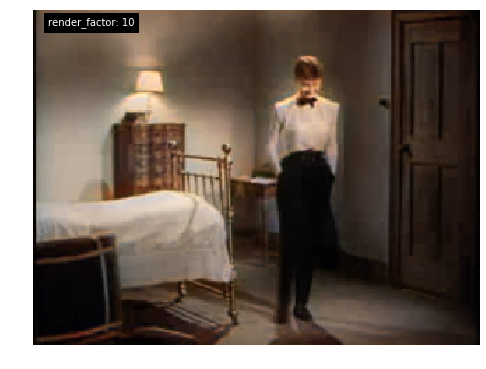

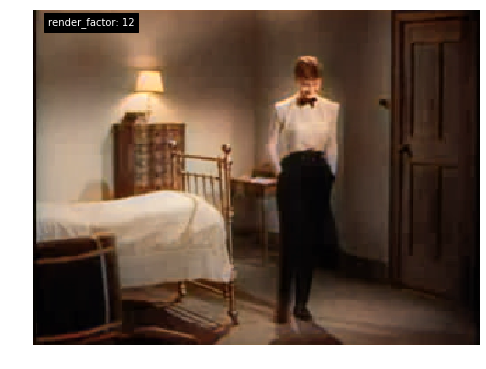

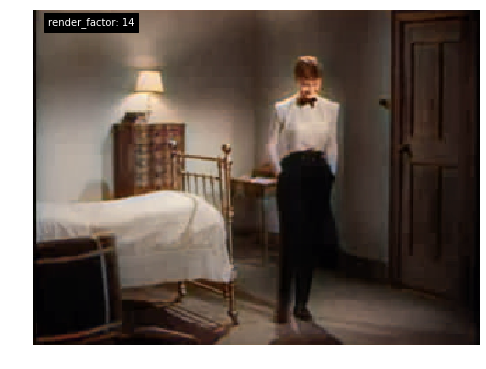

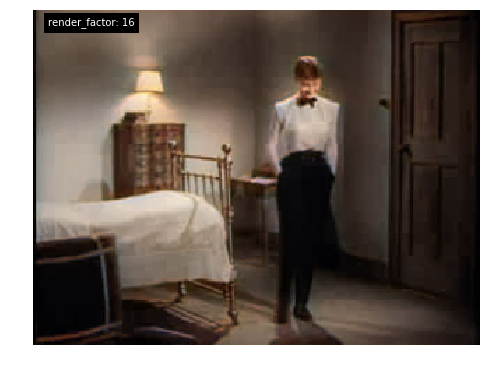

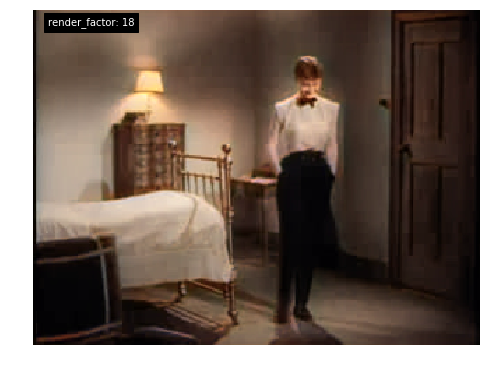

...

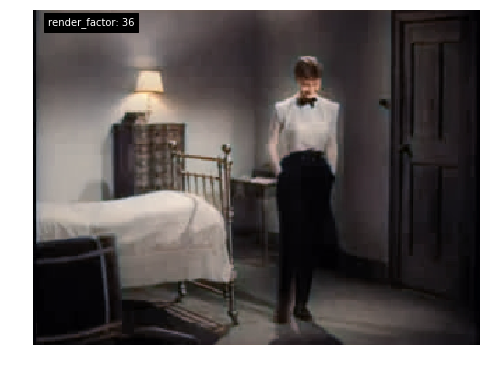

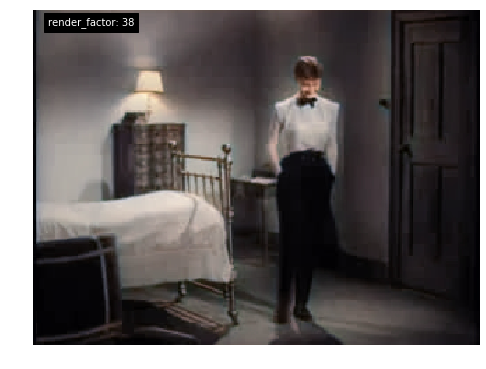

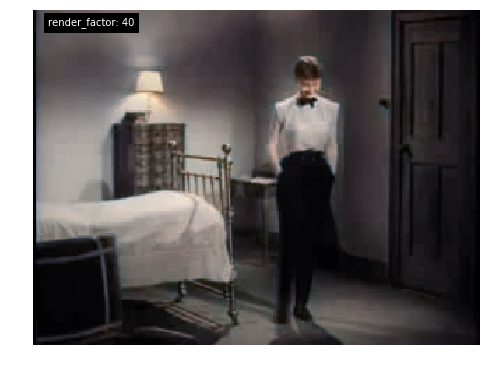

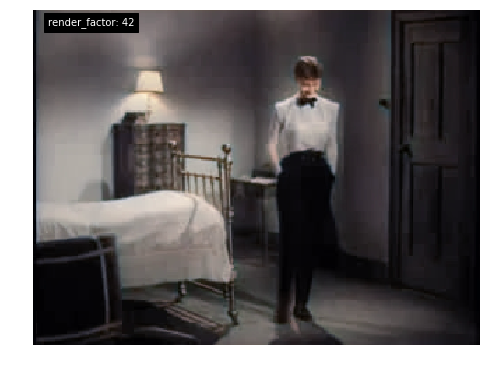

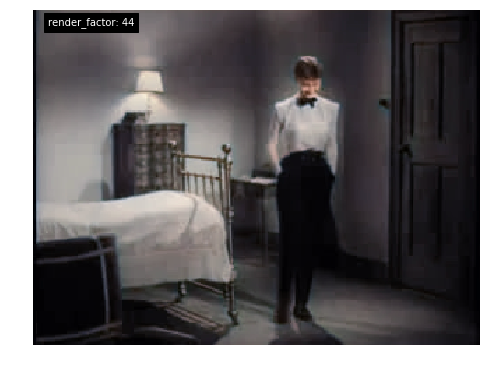

In [14]:
for i in range(10,45,2):
  colorizer.vis.plot_transformed_image('video/bwframes/video/00001.jpg',render_factor=i,display_render_factor=True,figsize=(8,8))